In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
assert torch.__version__.startswith("1.6")
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
%cd drive/My Drive/cyc3600

/content/drive/My Drive/cyc3600


In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances('cyclone_ds_train', {}, 'modnew.json', 'train')
#register_coco_instances('temp_train', {}, 'ftrain80.json', 'train')

In [ ]:
cyclone_metadata = MetadataCatalog.get('cyclone_ds_train')
#cyclone_metadata = MetadataCatalog.get('temp_train')

In [ ]:
dataset_dicts = DatasetCatalog.get('cyclone_ds_train')

[10/11 07:43:23 d2.data.datasets.coco]: Loaded 7868 images in COCO format from modnew.json


{'file_name': 'train/ssd_20181216_12_flip.png', 'height': 1201, 'width': 3600, 'image_id': 3915, 'annotations': [{'iscrowd': 0, 'bbox': [2361, 617, 80, 80], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [594, 718, 80, 80], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [793, 690, 80, 80], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [537, 467, 80, 80], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [858, 450, 80, 80], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [1591, 432, 80, 80], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [2051, 330, 80, 80], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}
train/ssd_20181216_12_flip.png


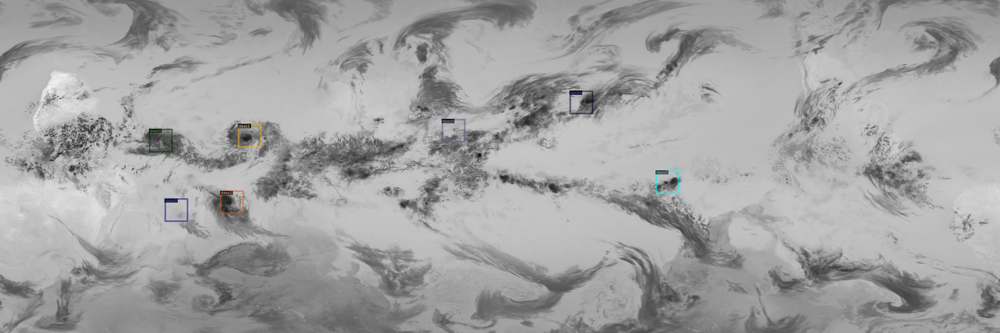

{'file_name': 'train/ssd_20160803_18_flip.png', 'height': 1201, 'width': 3600, 'image_id': 487, 'annotations': [{'iscrowd': 0, 'bbox': [2703, 735, 80, 80], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [2214, 772, 80, 80], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [2343, 704, 80, 80], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [462, 817, 80, 80], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [680, 813, 80, 80], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}
train/ssd_20160803_18_flip.png


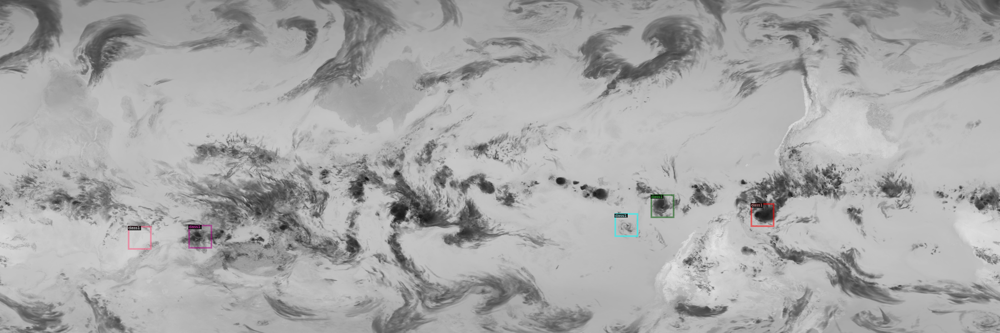

In [ ]:
import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 2):
    print(d)
    print(d['file_name'])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

{'file_name': 'train/ssd_20171230_18.png', 'height': 1201, 'width': 3600, 'image_id': 6511, 'annotations': [{'iscrowd': 0, 'bbox': [1193, 799, 80, 80], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [609, 673, 80, 80], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [1051, 534, 80, 80], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}
train/ssd_20171230_18.png


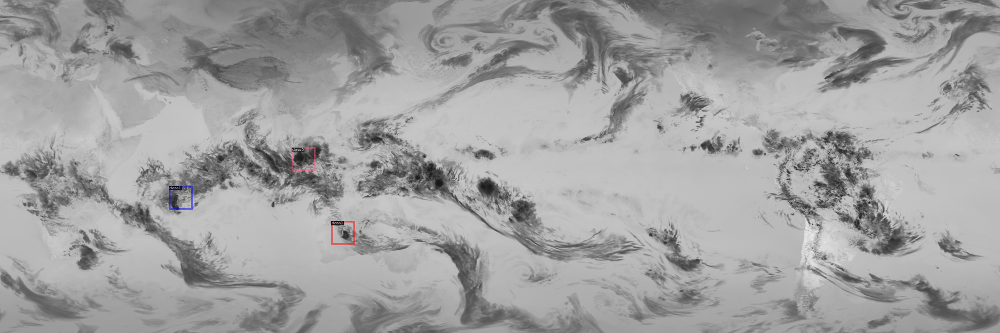

{'file_name': 'train/ssd_20170316_00_flip.png', 'height': 1201, 'width': 3600, 'image_id': 1382, 'annotations': [{'iscrowd': 0, 'bbox': [366, 742, 80, 80], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [484, 264, 80, 80], 'category_id': 2, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [543, 526, 80, 80], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}
train/ssd_20170316_00_flip.png


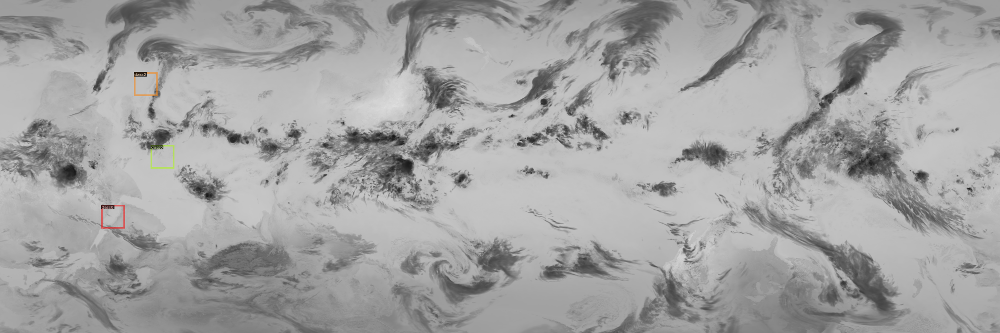

In [ ]:
import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 2):
    print(d)
    print(d['file_name'])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

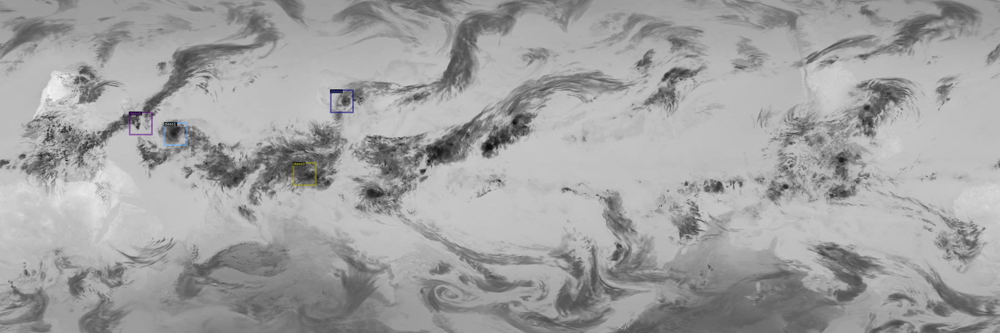

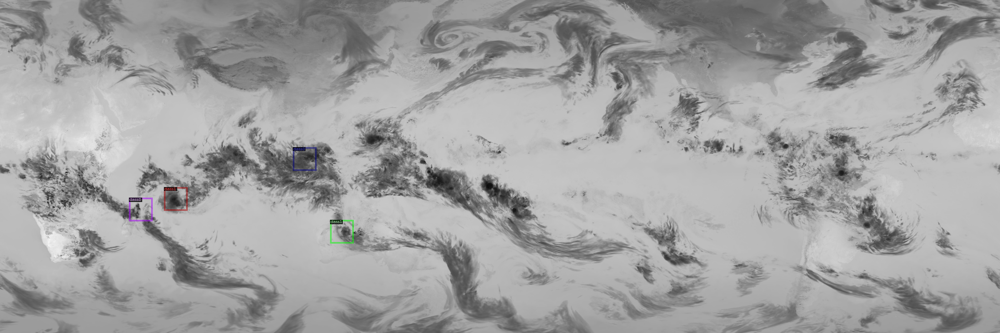

In [ ]:
import random
from detectron2.utils.visualizer import Visualizer

for d in dataset_dicts:
    if d['file_name'] == 'train/ssd_20171230_12_flip.png':
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
        vis = visualizer.draw_dataset_dict(d)
        cv2_imshow(vis.get_image()[:, :, ::-1])
    elif d['file_name'] == 'train/ssd_20171230_12.png':
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
        vis = visualizer.draw_dataset_dict(d)
        cv2_imshow(vis.get_image()[:, :, ::-1])
        break


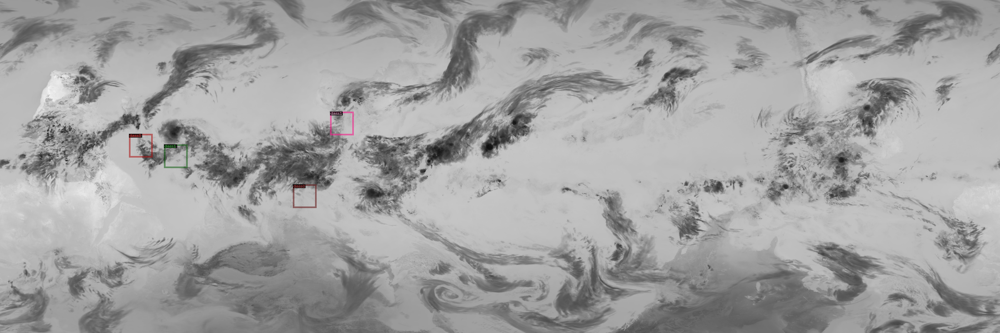

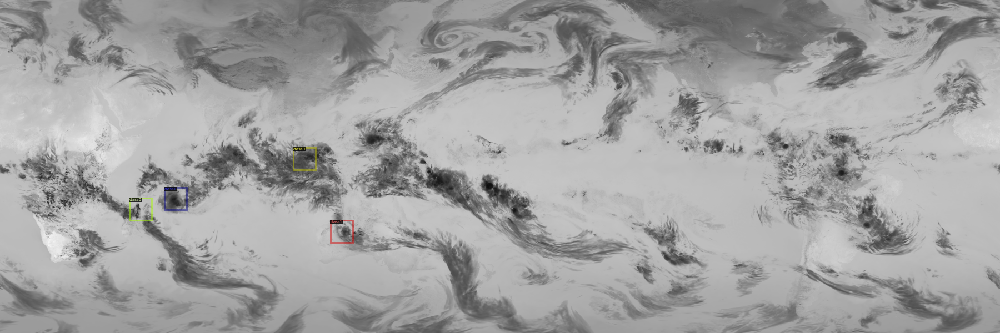

In [ ]:
import random
from detectron2.utils.visualizer import Visualizer

for d in dataset_dicts:
    if d['file_name'] == 'train/ssd_20171230_12_flip.png':
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
        vis = visualizer.draw_dataset_dict(d)
        cv2_imshow(vis.get_image()[:, :, ::-1])
    elif d['file_name'] == 'train/ssd_20171230_12.png':
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
        vis = visualizer.draw_dataset_dict(d)
        cv2_imshow(vis.get_image()[:, :, ::-1])
        break


In [ ]:
temp1

{'annotations': [{'bbox': [536, 503, 80, 80],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 0,
   'iscrowd': 0},
  {'bbox': [1594, 510, 80, 80],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 0,
   'iscrowd': 0},
  {'bbox': [1689, 509, 80, 80],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 0,
   'iscrowd': 0}],
 'file_name': 'train/ssd_20160401_00_flip.png',
 'height': 1201,
 'image_id': 0,
 'width': 3600}

train/ssd_20160401_00_flip.png


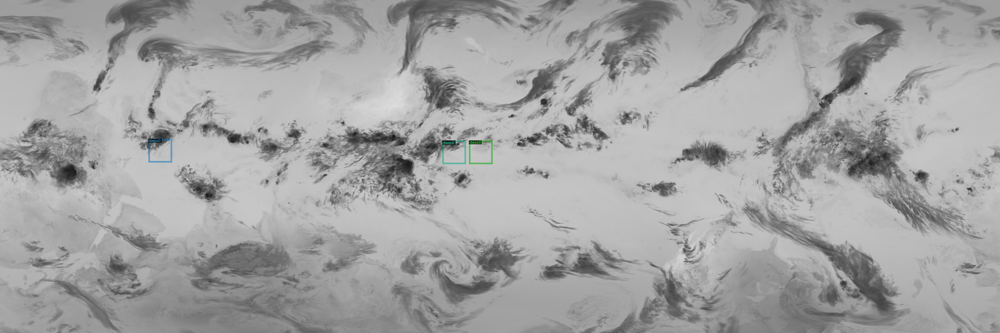

train/ssd_20160401_00_flip.png


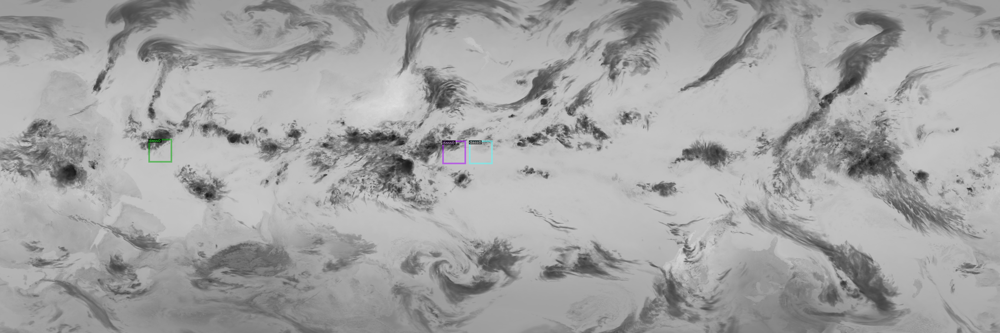

In [ ]:
# flipped_img = 'train/ssd_20171020_18_flip.png'
# orig_img = 'train/ssd_20171020_18.png'

img_orig = cv2.imread(temp1['file_name'])
print(temp1['file_name'])
visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
vis = visualizer.draw_dataset_dict(temp1)
cv2_imshow(vis.get_image()[:, :, ::-1])

img_flip = cv2.imread(temp2['file_name'])
print(temp2['file_name'])
visualizer = Visualizer(img[:, :, ::-1],
metadata=cyclone_metadata, scale=0.5)
vis = visualizer.draw_dataset_dict(temp2)
cv2_imshow(vis.get_image()[:, :, ::-1])

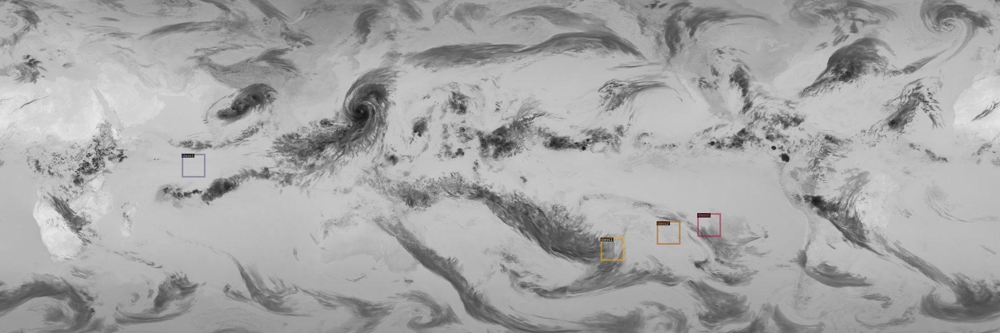

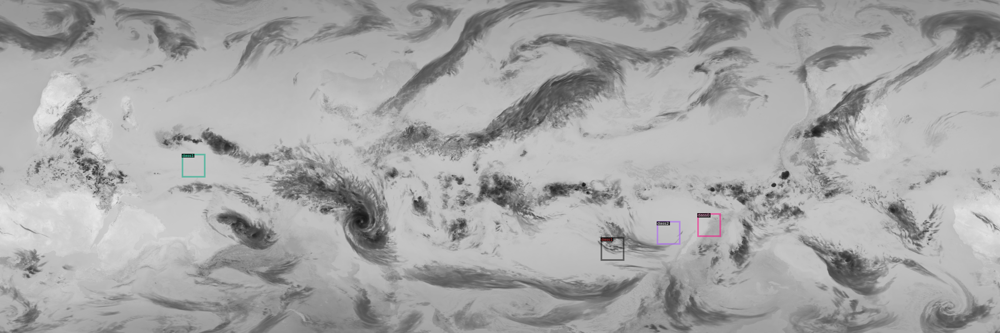

In [ ]:
flipped_img = 'train/ssd_20171020_12_flip.png'
orig_img = 'train/ssd_20171020_12.png'

img = cv2.imread(orig_img)
visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
vis = visualizer.draw_dataset_dict(d)
cv2_imshow(vis.get_image()[:, :, ::-1])

img = cv2.imread(flipped_img)
visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
vis = visualizer.draw_dataset_dict(d)
cv2_imshow(vis.get_image()[:, :, ::-1])

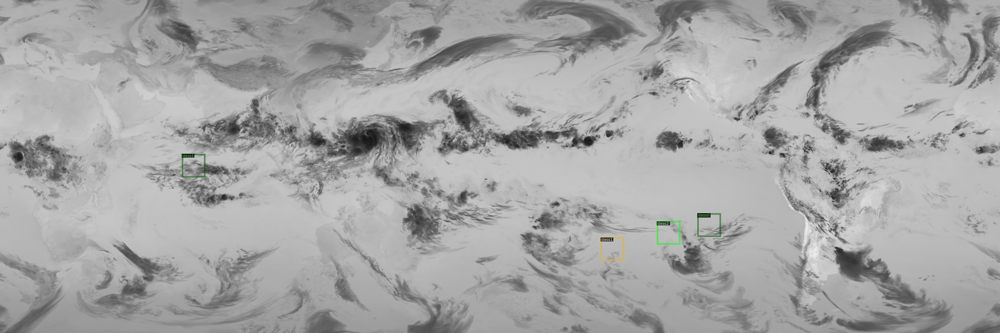

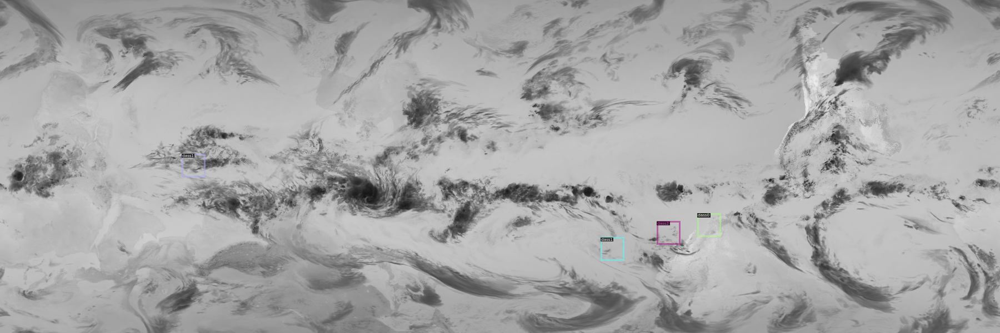

In [ ]:
flipped_img = 'train/ssd_20171017_18_flip.png'
orig_img = 'train/ssd_20171017_18.png'

img = cv2.imread(orig_img)
visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
vis = visualizer.draw_dataset_dict(d)
cv2_imshow(vis.get_image()[:, :, ::-1])

img = cv2.imread(flipped_img)
visualizer = Visualizer(img[:, :, ::-1], metadata=cyclone_metadata, scale=0.5)
vis = visualizer.draw_dataset_dict(d)
cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
temp = (d['file_name'] == 'train/ssd_20171017_18.png')

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml"))
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_DC5_3x.yaml"))
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
# cfg.merge_from_file(
#     "./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
# )
cfg.DATASETS.TRAIN = ("cyclone_ds_train",)
cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
#cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 1
cfg.SOLVER.BASE_LR = 0.002
cfg.SOLVER.MAX_ITER = (
    2000
)  # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (
    1280
)  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # 3 classes (data, fig, hazelnut)
cfg.INPUT.MAX_SIZE_TEST = 3600
cfg.INPUT.MAX_SIZE_TRAIN = 3600
cfg.INPUT.MIN_SIZE_TEST = 1201
cfg.INPUT.MIN_SIZE_TRAIN = 1201
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[60,70,80,90]]


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

WARNING [10/11 07:45:55 d2.modeling.backbone.resnet]: ResNet.make_stage(first_stride=) is deprecated!  Use 'stride_per_block' or 'stride' instead.
[10/11 07:46:05 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (

R-101.pkl: 179MB [00:16, 10.8MB/s]                           


[10/11 07:46:24 d2.checkpoint.c2_model_loading]: Remapping C2 weights ......
[10/11 07:46:24 d2.checkpoint.c2_model_loading]: backbone.res2.0.conv1.norm.bias                      loaded from res2_0_branch2a_bn_beta           of shape (64,)
[10/11 07:46:24 d2.checkpoint.c2_model_loading]: backbone.res2.0.conv1.norm.running_mean              loaded from res2_0_branch2a_bn_running_mean   of shape (64,)
[10/11 07:46:24 d2.checkpoint.c2_model_loading]: backbone.res2.0.conv1.norm.running_var               loaded from res2_0_branch2a_bn_running_var    of shape (64,)
[10/11 07:46:24 d2.checkpoint.c2_model_loading]: backbone.res2.0.conv1.norm.weight                    loaded from res2_0_branch2a_bn_gamma          of shape (64,)
[10/11 07:46:24 d2.checkpoint.c2_model_loading]: backbone.res2.0.conv1.weight                         loaded from res2_0_branch2a_w                 of shape (64, 64, 1, 1)
[10/11 07:46:24 d2.checkpoint.c2_model_loading]: backbone.res2.0.conv2.norm.bias                   

/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


[10/11 07:47:23 d2.utils.events]:  eta: 1:30:00  iter: 19  total_loss: 1.664  loss_cls: 0.766  loss_box_reg: 0.007  loss_rpn_cls: 0.736  loss_rpn_loc: 0.097  time: 2.7177  data_time: 0.0463  lr: 0.000040  max_mem: 8315M
[10/11 07:48:21 d2.utils.events]:  eta: 1:32:14  iter: 39  total_loss: 0.710  loss_cls: 0.048  loss_box_reg: 0.005  loss_rpn_cls: 0.583  loss_rpn_loc: 0.043  time: 2.8084  data_time: 0.0032  lr: 0.000080  max_mem: 8315M
[10/11 07:49:18 d2.utils.events]:  eta: 1:32:01  iter: 59  total_loss: 0.467  loss_cls: 0.081  loss_box_reg: 0.008  loss_rpn_cls: 0.365  loss_rpn_loc: 0.051  time: 2.8260  data_time: 0.0033  lr: 0.000120  max_mem: 8315M
[10/11 07:50:15 d2.utils.events]:  eta: 1:31:19  iter: 79  total_loss: 0.396  loss_cls: 0.071  loss_box_reg: 0.010  loss_rpn_cls: 0.248  loss_rpn_loc: 0.070  time: 2.8335  data_time: 0.0033  lr: 0.000160  max_mem: 8315M
[10/11 07:51:13 d2.utils.events]:  eta: 1:30:30  iter: 99  total_loss: 0.379  loss_cls: 0.086  loss_box_reg: 0.033  loss

In [ ]:
register_coco_instances('cyclone_ds_val', {}, 'modval.json', 'val')

In [ ]:
val_metadata = MetadataCatalog.get('cyclone_ds_val')
val_dicts = DatasetCatalog.get('cyclone_ds_val')

[10/11 09:25:58 d2.data.datasets.coco]: Loaded 1407 images in COCO format from modval.json


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4 # set the testing threshold for this model
cfg.DATASETS.TEST = ("cyclone_ds_val", )
predictor = DefaultPredictor(cfg)

WARNING [10/11 09:26:17 d2.modeling.backbone.resnet]: ResNet.make_stage(first_stride=) is deprecated!  Use 'stride_per_block' or 'stride' instead.


In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in val_dicts:
    print(d['file_name'])
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs)

val/ssd_20190101_00.png
{'instances': Instances(num_instances=3, image_height=1201, image_width=3600, fields=[pred_boxes: Boxes(tensor([[1056.7375,  487.7224, 1143.5828,  570.9820],
        [ 136.4949,  731.7491,  221.8340,  813.2714],
        [1365.4805,  696.0743, 1442.9282,  775.5045]], device='cuda:0')), scores: tensor([0.6823, 0.5380, 0.4407], device='cuda:0'), pred_classes: tensor([1, 1, 1], device='cuda:0')])}
val/ssd_20190101_06.png
{'instances': Instances(num_instances=2, image_height=1201, image_width=3600, fields=[pred_boxes: Boxes(tensor([[ 133.7047,  738.5430,  215.6843,  819.6987],
        [1050.2585,  495.0830, 1130.6636,  570.7262]], device='cuda:0')), scores: tensor([0.6071, 0.5636], device='cuda:0'), pred_classes: tensor([1, 1], device='cuda:0')])}
val/ssd_20190101_12.png
{'instances': Instances(num_instances=1, image_height=1201, image_width=3600, fields=[pred_boxes: Boxes(tensor([[1050.8483,  498.5009, 1132.1046,  575.5790]], device='cuda:0')), scores: tensor([0.494

KeyboardInterrupt: ignored